# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [1]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from scipy import signal


# Obrazki
if not os.path.exists("jet.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/jet.png --no-check-certificate
if not os.path.exists("kw.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/kw.png --no-check-certificate
if not os.path.exists("moon.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/moon.png --no-check-certificate
if not os.path.exists("lenaSzum.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/lenaSzum.png --no-check-certificate
if not os.path.exists("lena.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/lena.png --no-check-certificate
if not os.path.exists("plansza.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/plansza.png --no-check-certificate


jet = cv2.imread('jet.png')           # Read image
jet = cv2.cvtColor(jet, cv2.COLOR_BGR2GRAY) # Convert to RGB

kw = cv2.imread('kw.png')
kw = cv2.cvtColor(kw, cv2.COLOR_BGR2GRAY)

moon = cv2.imread('moon.png')
moon = cv2.cvtColor(moon, cv2.COLOR_BGR2GRAY)

lenaSzum = cv2.imread('lenaSzum.png')
lenaSzum = cv2.cvtColor(lenaSzum, cv2.COLOR_BGR2GRAY)

lena = cv2.imread('lena.png')
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)

plansza = cv2.imread('plansza.png')
plansza = cv2.cvtColor(plansza, cv2.COLOR_BGR2GRAY)

imgs = [jet, kw, moon, lenaSzum, lena, plansza]

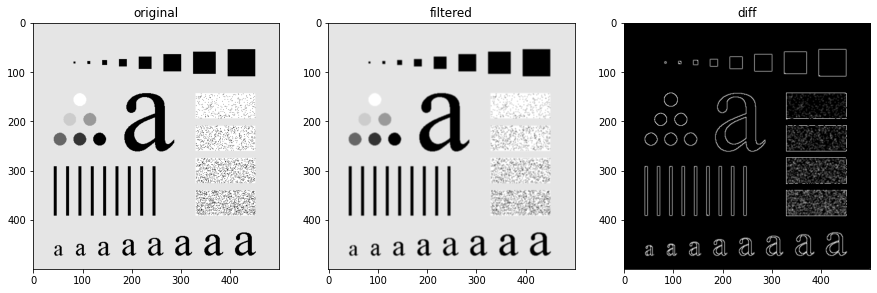

In [2]:
def plot_filtration(original, filtered, plot_original=True, plot_res=True):
    i = 0
    if plot_original:
        fig, ax = plt.subplots(1, 3)
    else:
        fig, ax = plt.subplots(1, 2)

    fig.set_size_inches(15, 10)
    if plot_original:
        ax[i].set_title("original")
        ax[i].imshow(original, cmap ="gray")
        i += 1

    if plot_res:
        ax[i].set_title("filtered")
        ax[i].imshow(filtered, cmap="gray")

        i+=1
        ax[i].set_title("diff")
        ax[i].imshow(np.abs(original - filtered), cmap="gray")

    plt.show()

def filter(img, *function_args, plot=True, plot_original=True, plot_res=True,
           function = cv2.filter2D, ret=False, **function_args_dict):
    res = function(img, *function_args, **function_args_dict)

    if plot:
        plot_filtration(img, res, plot_original, plot_res)


    if ret:
        return res

filter(plansza, kernel=np.ones((3, 3))/9, ddepth=-1)

5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik. 

original


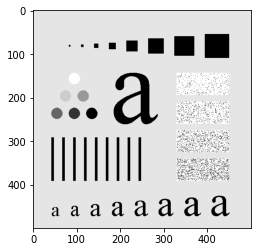

3x3


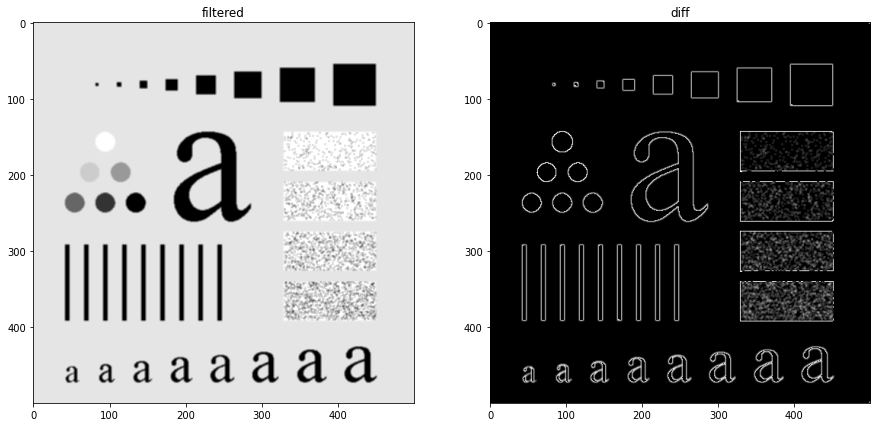

5x5


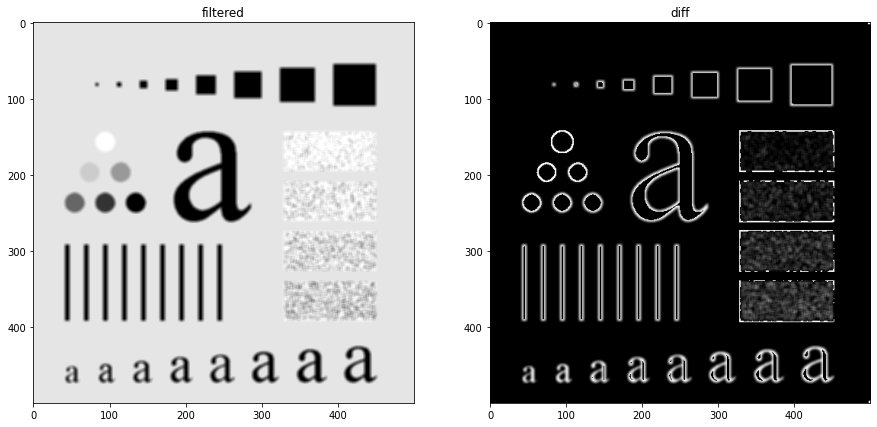

8x8


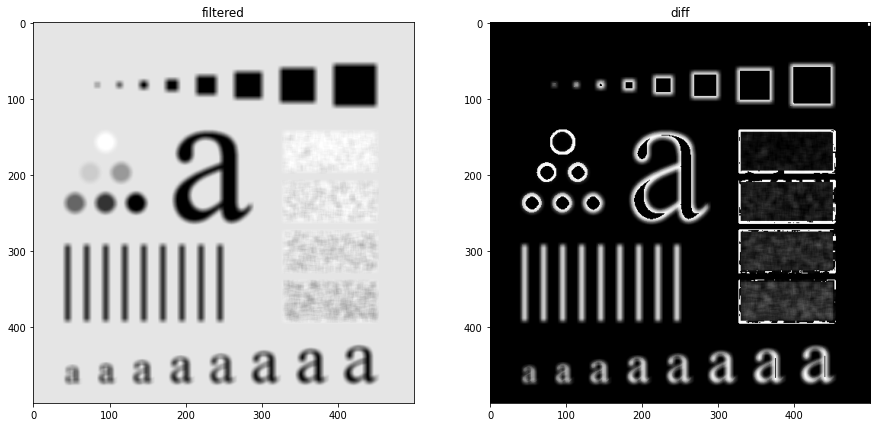

15x15


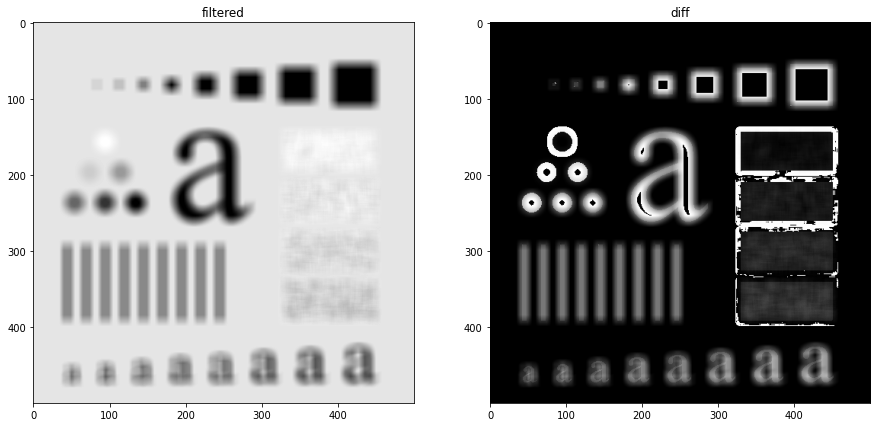

35x35


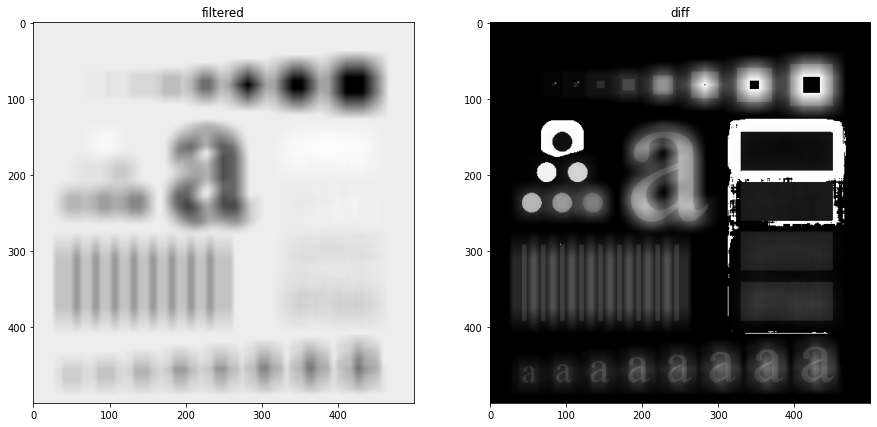

In [3]:
def test_filtration(img, *function_args, function = cv2.filter2D, **function_args_dict ):
    print("original")
    plt.imshow(img, cmap="gray")
    plt.show()

    kernel = function_args_dict.get("kernel", None)

    for i in [3,5,8,15,35]:
        if kernel:
            function_args_dict["kernel"] = kernel(i)

        print(f"{i}x{i}")
        filter(img, *function_args, function=function, **function_args_dict, plot_original=False)



test_filtration(plansza, kernel=lambda i: np.ones((i, i))/(i*i), ddepth=-1)

6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

original


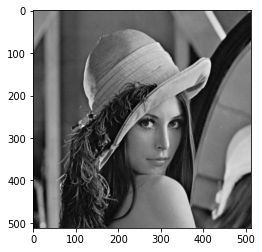

3x3


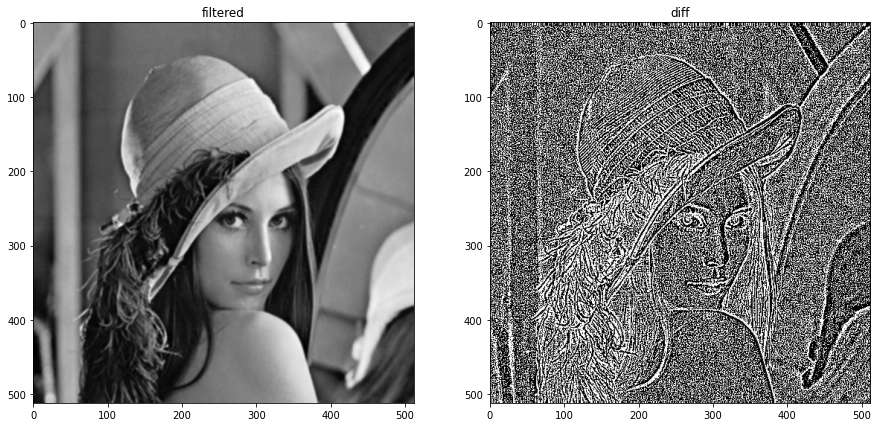

5x5


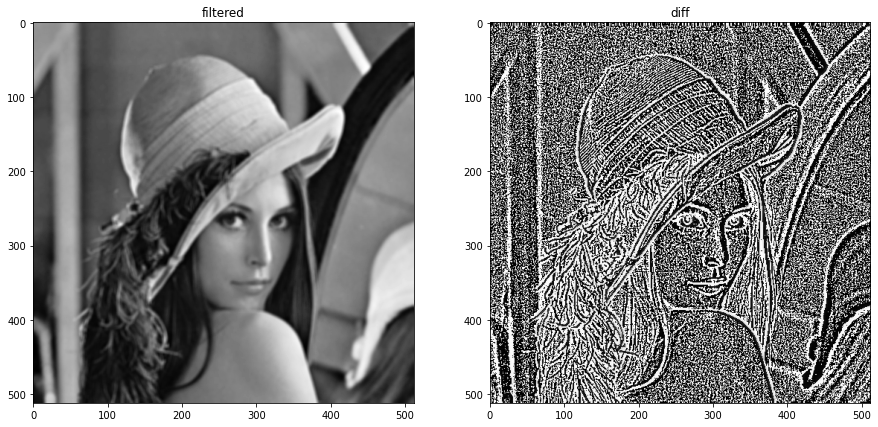

8x8


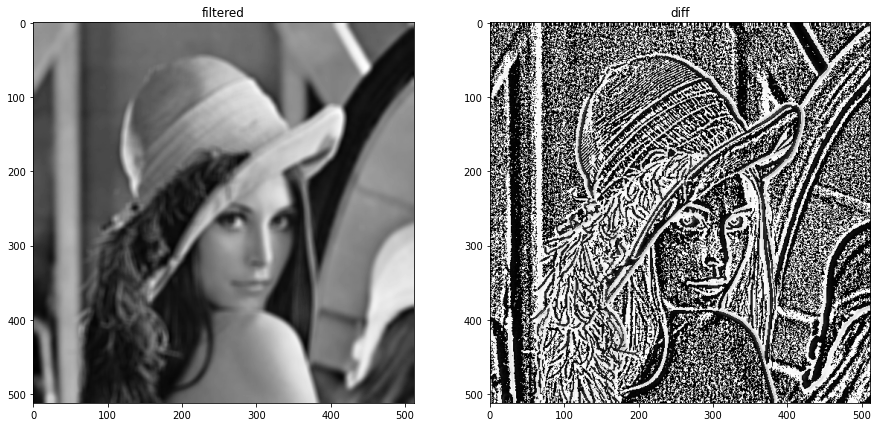

15x15


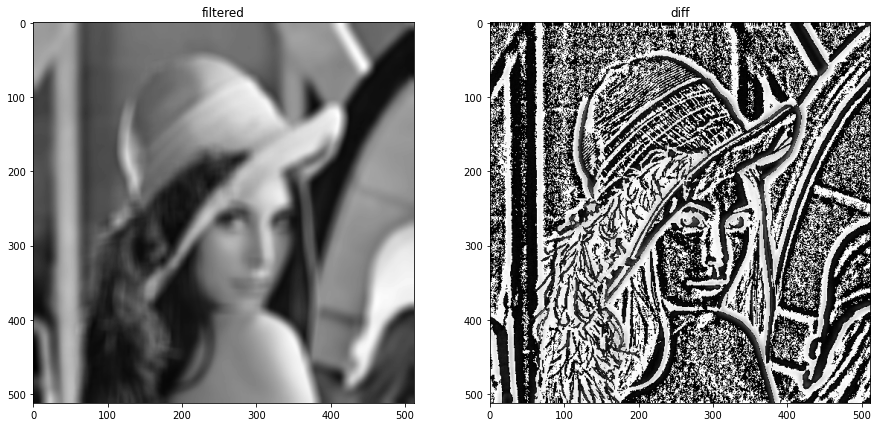

35x35


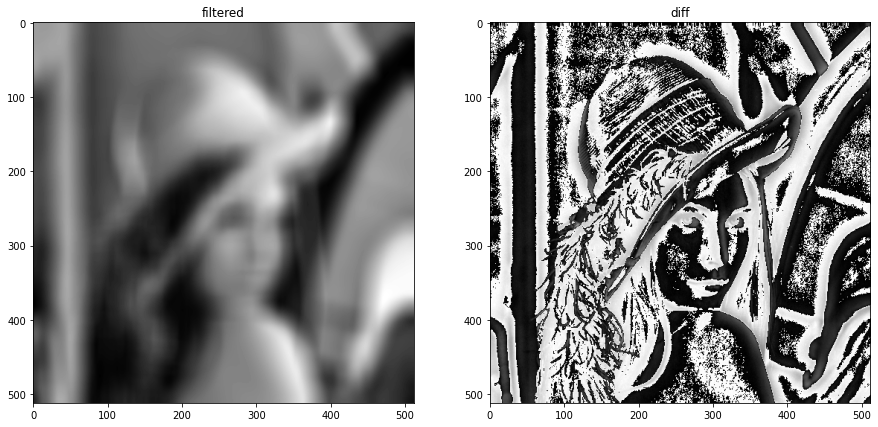

In [18]:
test_filtration(lena, kernel=lambda i: np.ones((i, i))/(i*i), ddepth=-1)

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

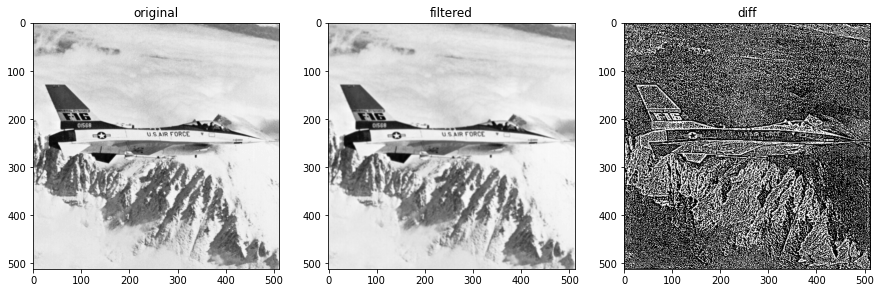

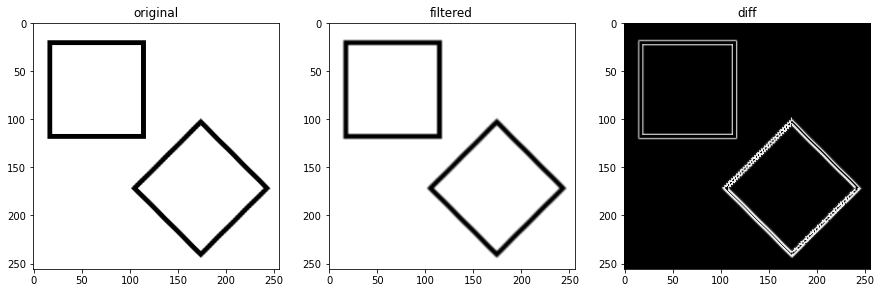

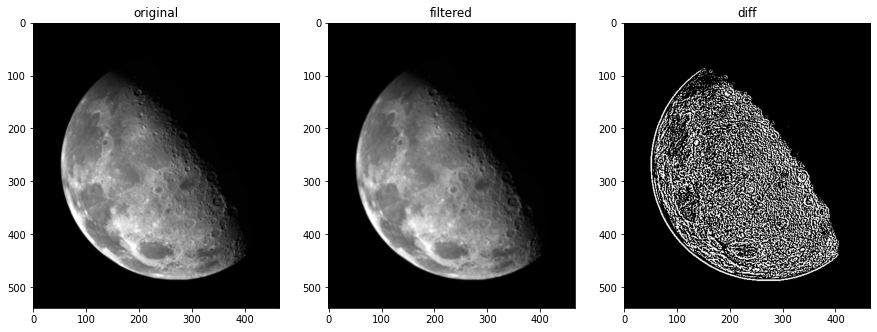

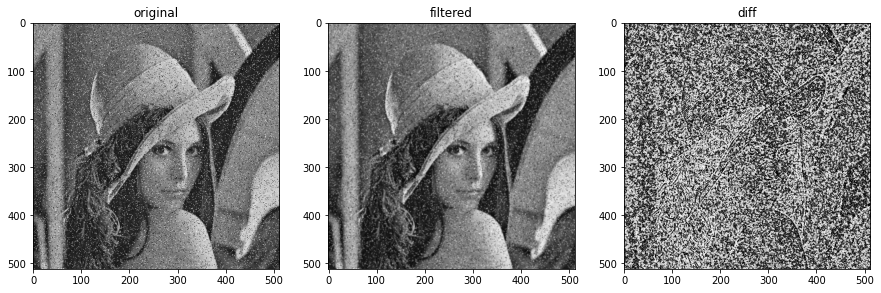

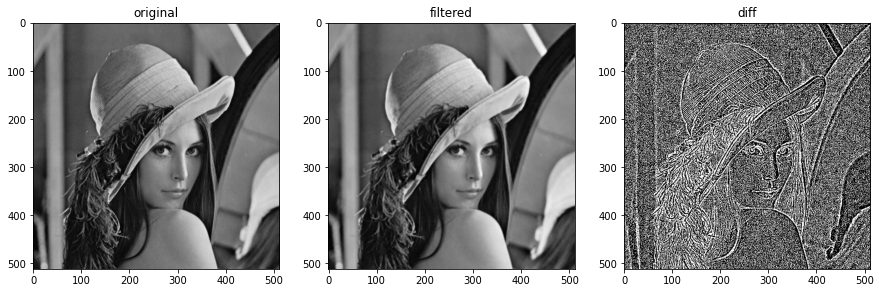

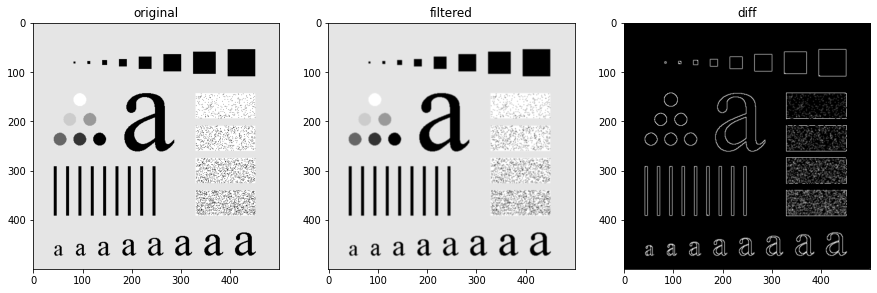

In [5]:
mask = np.array([[1, 2, 1],
                 [2, 4, 2],
                 [1, 2, 1]])
mask = mask / mask.sum()


for img in imgs:
    filter(img, kernel=mask, ddepth=-1)

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


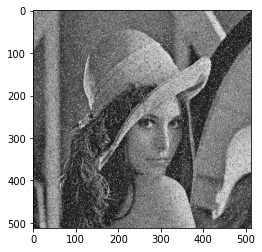

sigma = 0.4


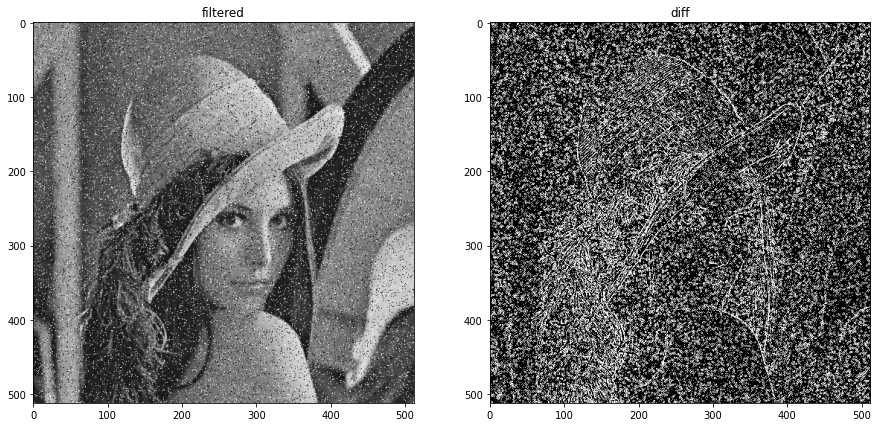

sigma = 0.6


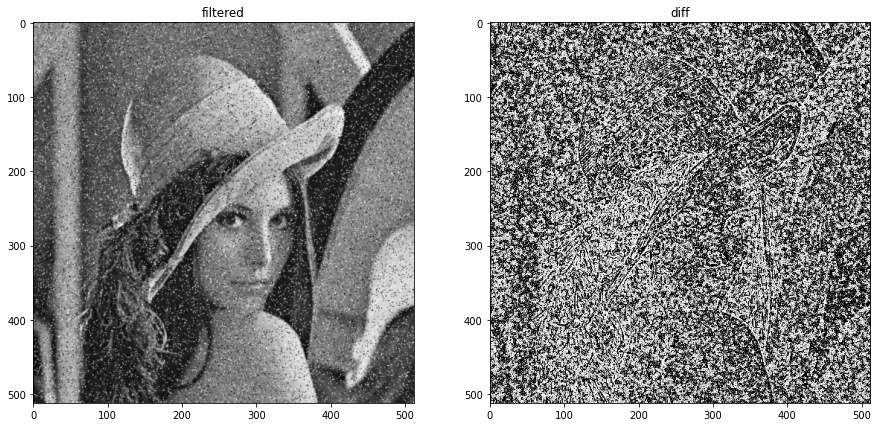

sigma = 0.8


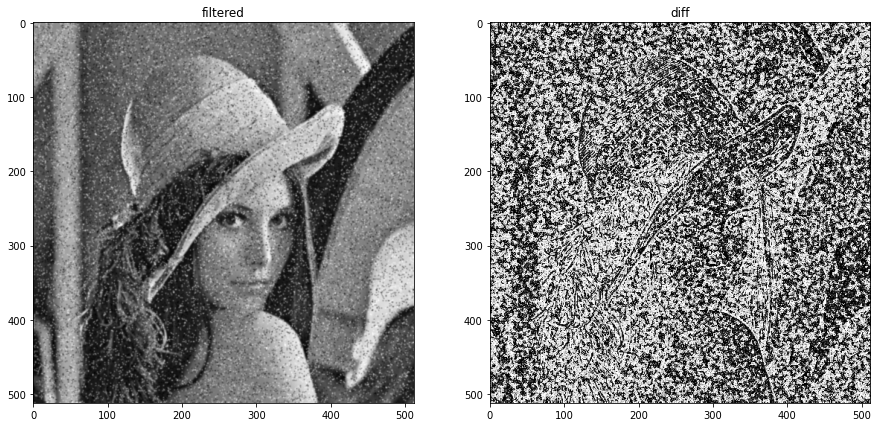

sigma = 1.0


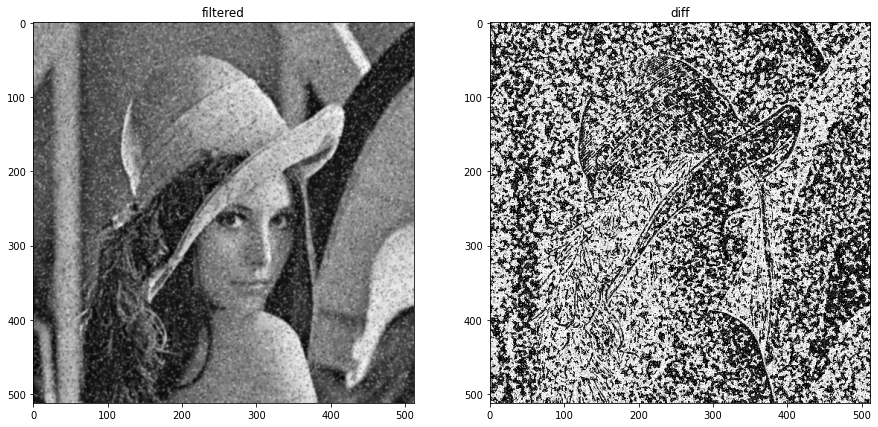

sigma = 1.2


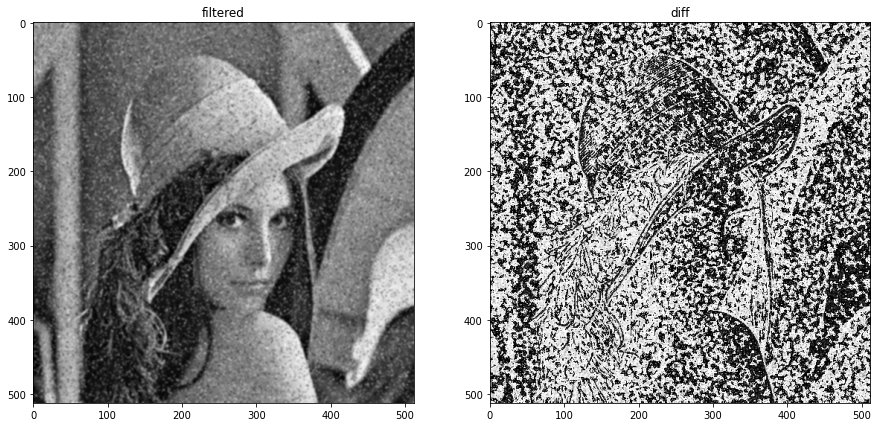

In [6]:
def fgaussian(size, sigma):
     m = n = size
     h, k = m//2, n//2
     x, y = np.mgrid[-h:h+1, -k:k+1]
     g = np.exp(-(x**2 + y**2)/(2*sigma**2))
     return g /g.sum() 
    
    
def mesh(fun, size):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    

    X = np.arange(-size//2, size//2, 1)
    Y = np.arange(-size//2, size//2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    
    ax.plot_surface(X, Y, Z)
    
    plt.show()

plt.imshow(lenaSzum, cmap ="gray")
plt.show()
for sigma in (i / 5 for i in range(2, 7)):
    print(f"sigma = {sigma}")
    filter(lenaSzum, kernel=fgaussian(5, sigma), ddepth=-1, plot_original=False)



### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


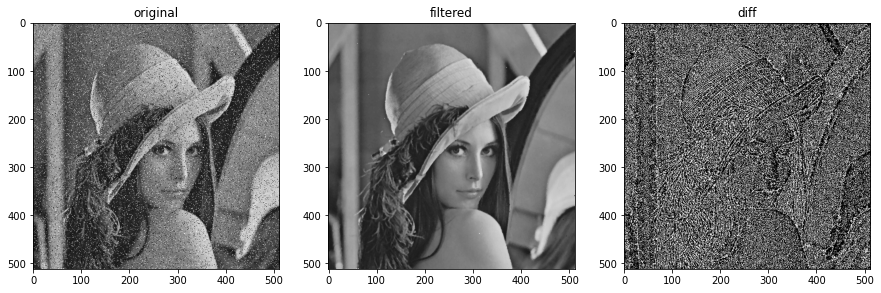

In [7]:
filter(lenaSzum, function=cv2.medianBlur, ksize=3)


2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

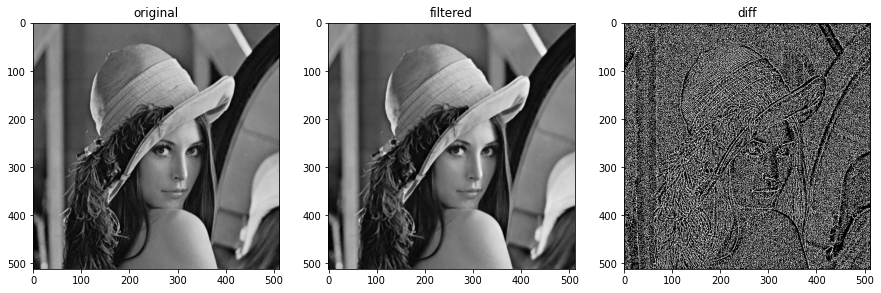

In [8]:
filter(lena, function=cv2.medianBlur, ksize=3)


3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

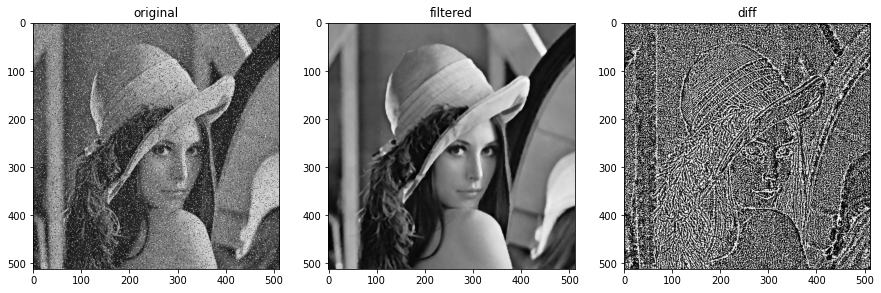

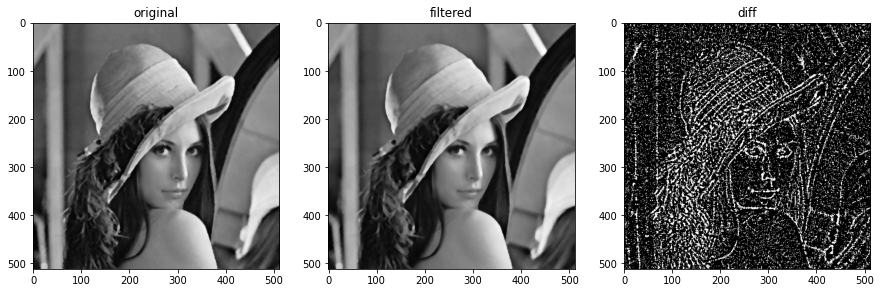

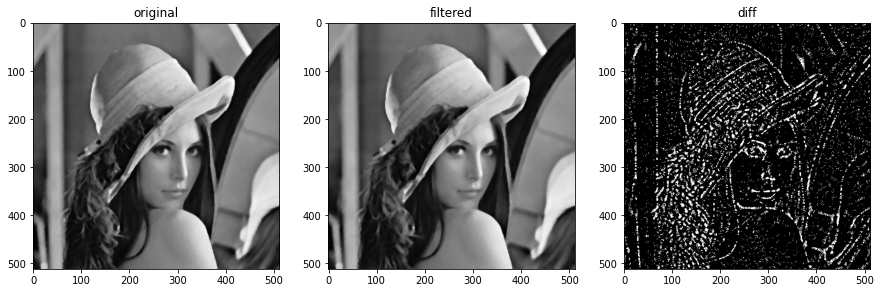

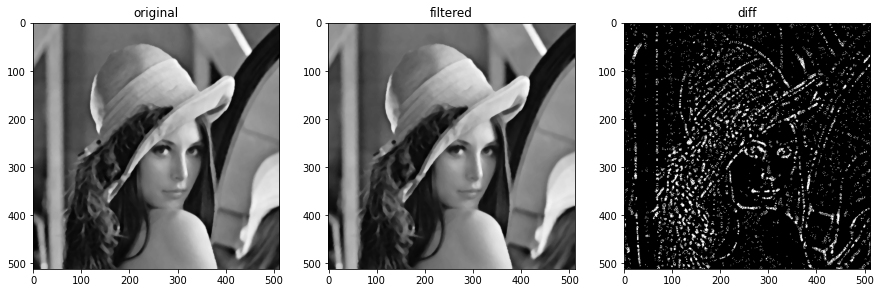

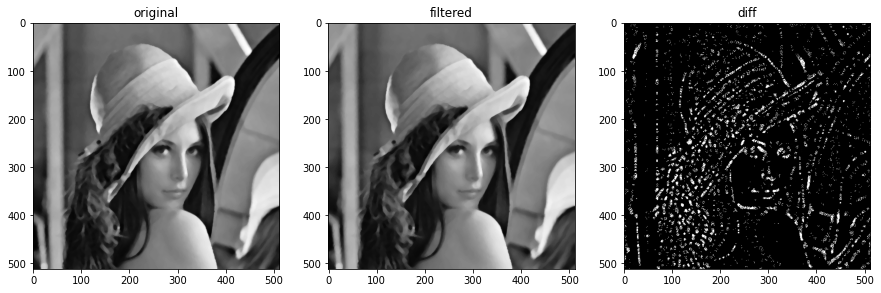

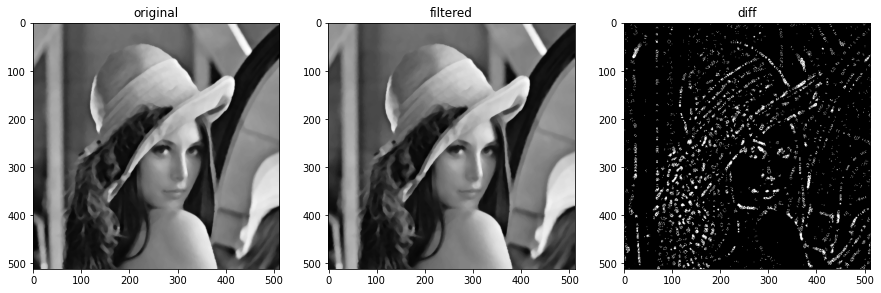

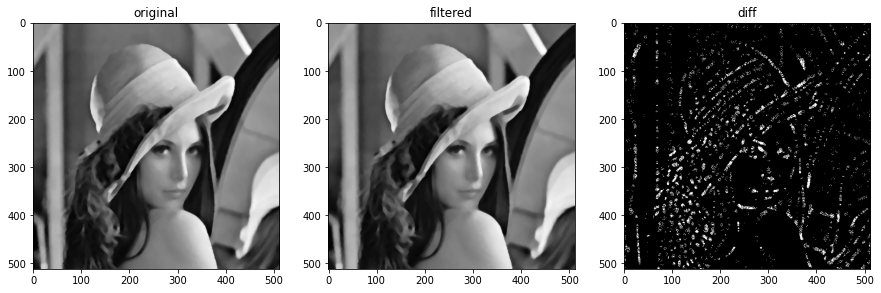

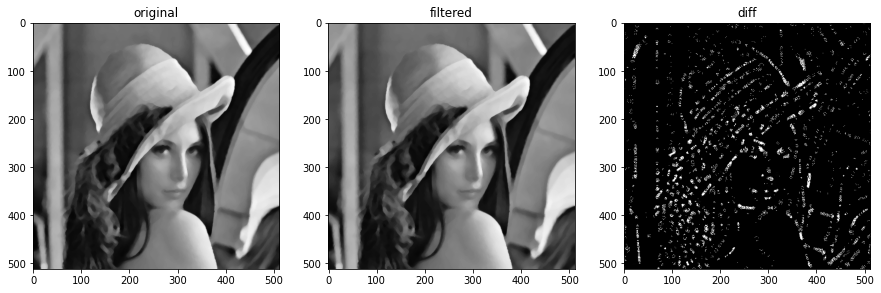

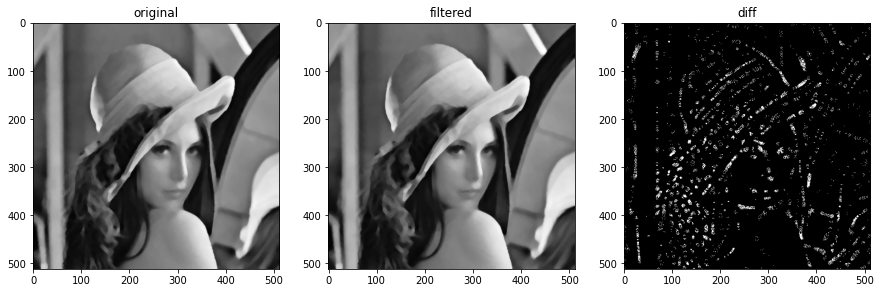

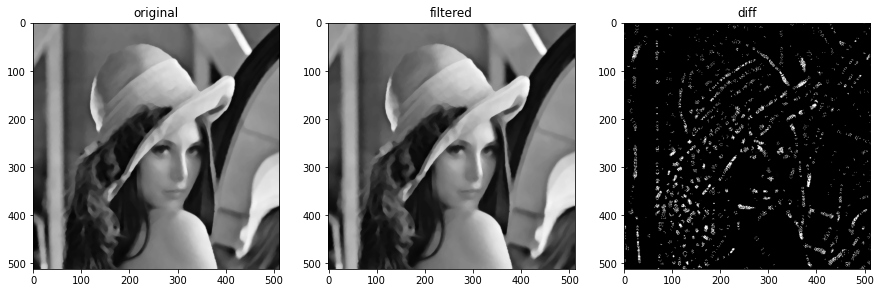

In [9]:
img = lenaSzum
for _ in range(10):
    img = filter(img, function=cv2.medianBlur, ksize=5, ret=True)


## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach. 

opencv
+128


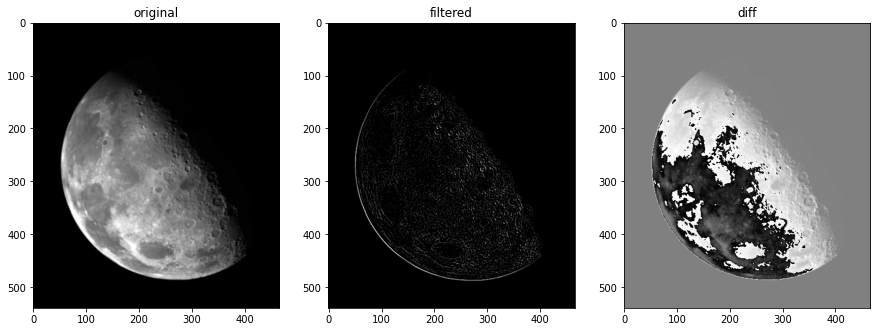

abs


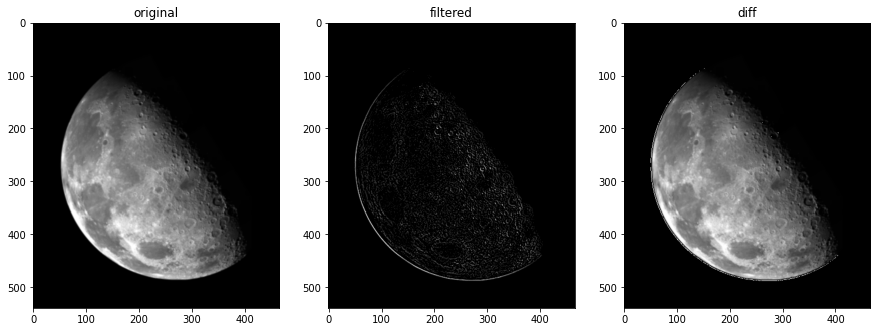

scipy signal
+128


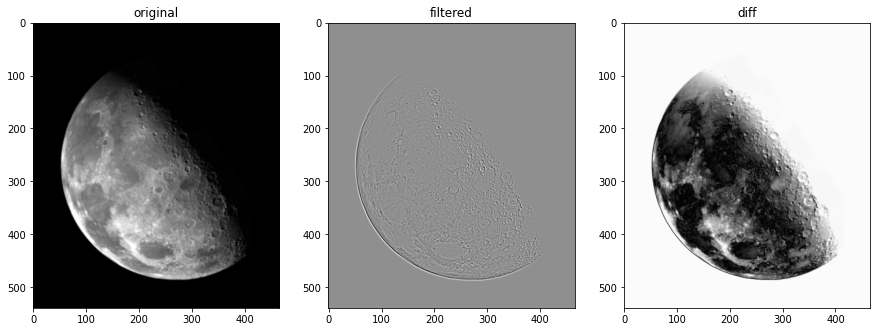

abs


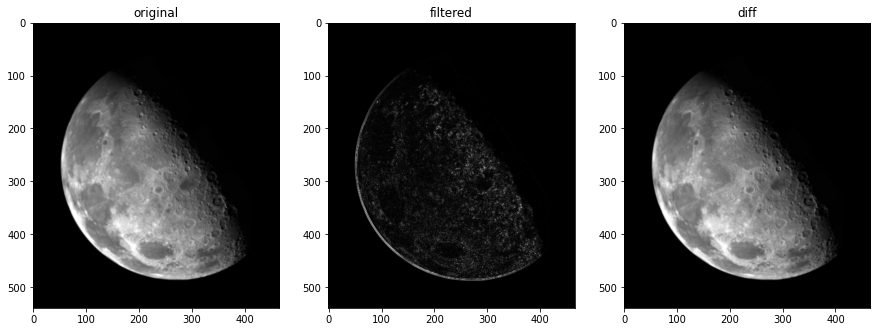

In [10]:
def plot_normalized(img, filtered):
    print("+128")
    plot_filtration(img, filtered + 128)
    print("abs")
    plot_filtration(img, np.abs(filtered))

mask = np.array([0, 1, 0, 1, -4, 1, 0, 1, 0]).reshape((3,3)) / 9

print("opencv")
res = filter(moon, kernel=mask, ddepth=-1, plot=False, ret=True)
plot_normalized(moon, res)

print("scipy signal")
res = filter(moon.astype(int), mask, function=signal.convolve2d, plot=False, ret=True, mode='same')
plot_normalized(moon, res)

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



opencv


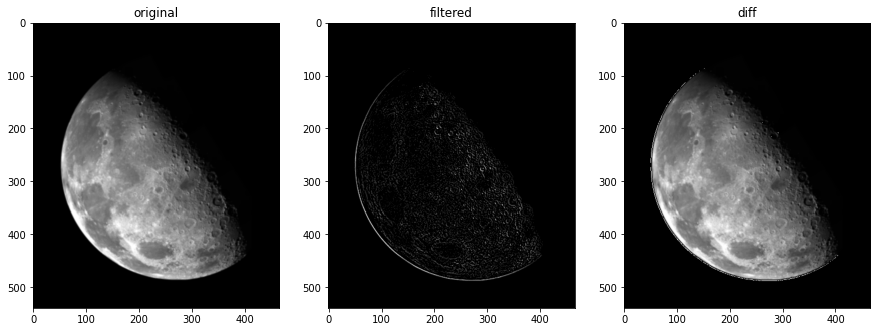

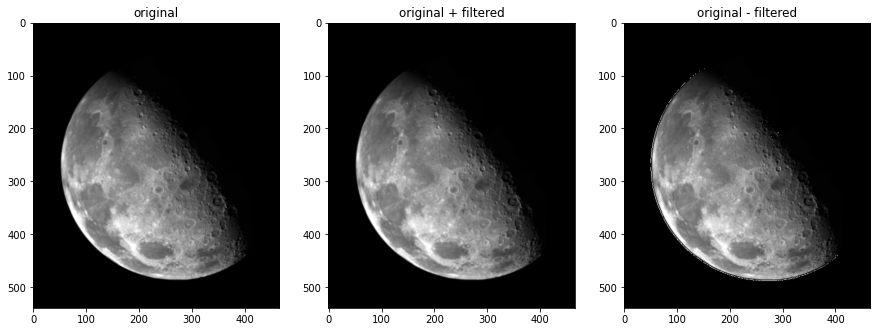

scipy signal


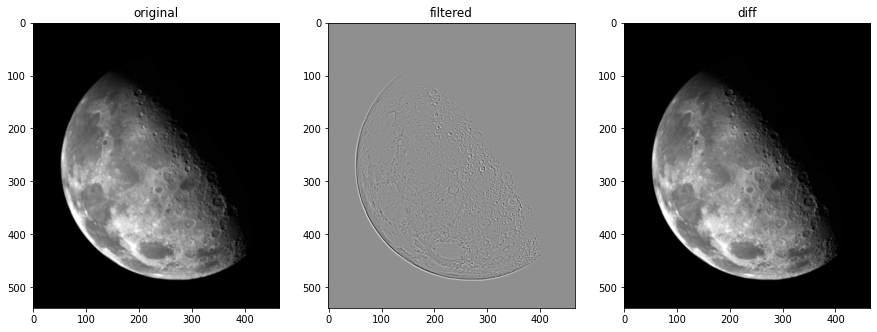

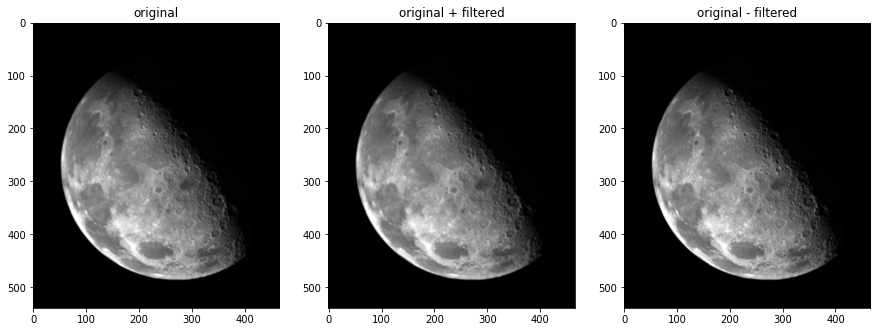

In [11]:
def lap_sharp(original, filtered):
    f,a = plt.subplots(1,3)
    f.set_size_inches(15, 10)

    a[0].set_title("original")
    a[0].imshow(original, 'gray')

    a[1].set_title("original + filtered")
    a[1].imshow(original+filtered, 'gray')

    a[2].set_title("original - filtered")
    a[2].imshow(np.abs(original-filtered), 'gray')

    plt.show()

print("opencv")
lap_sharp(moon, filter(moon, kernel=mask, ddepth=-1, plot=True, ret=True))

print("scipy signal")
lap_sharp(moon.astype(int), filter(moon.astype(int), mask, function=signal.convolve2d, plot=True, ret=True, mode='same'))

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

[[ 0  0  0]
 [-1  0  0]
 [ 0  1  0]]
+128


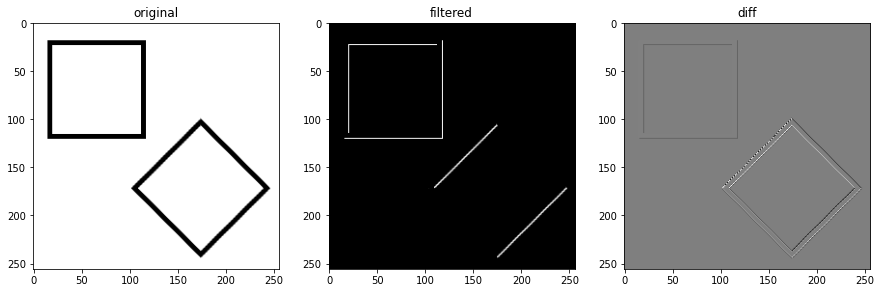

abs


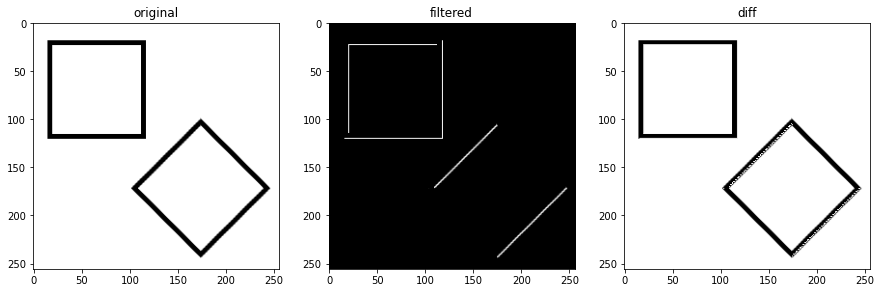

[[ 0  0  0]
 [ 0  0 -1]
 [ 0  1  0]]
+128


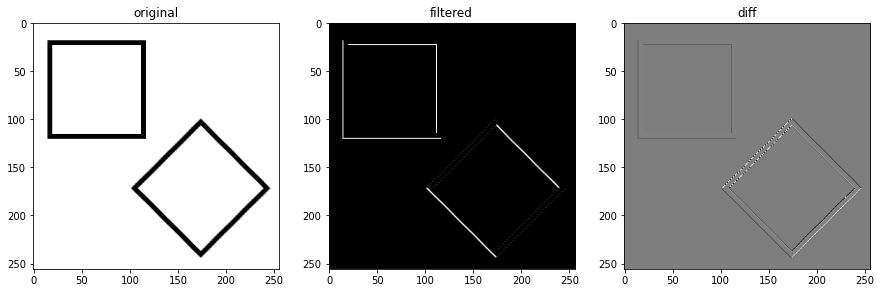

abs


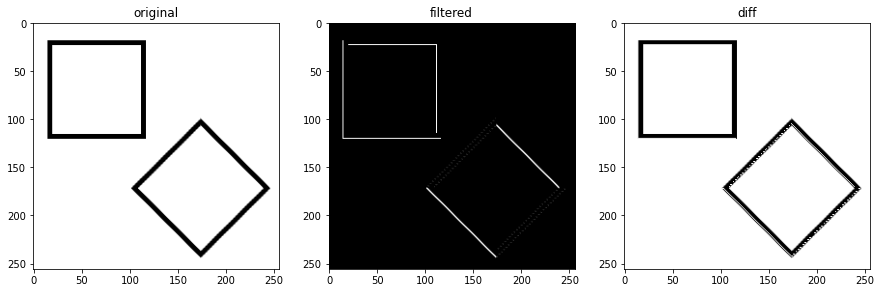

[[-1  0  1]
 [-1  0  1]
 [-1  0  1]]
+128


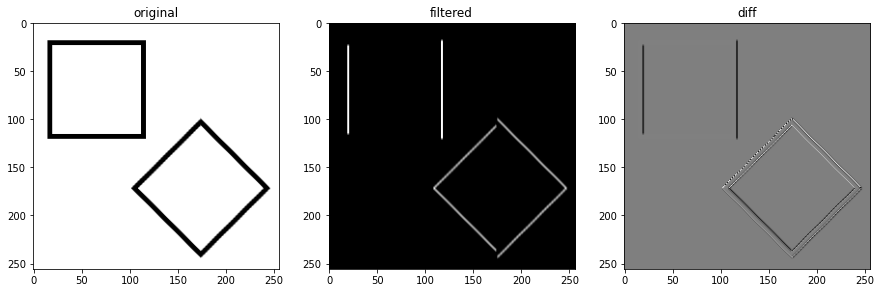

abs


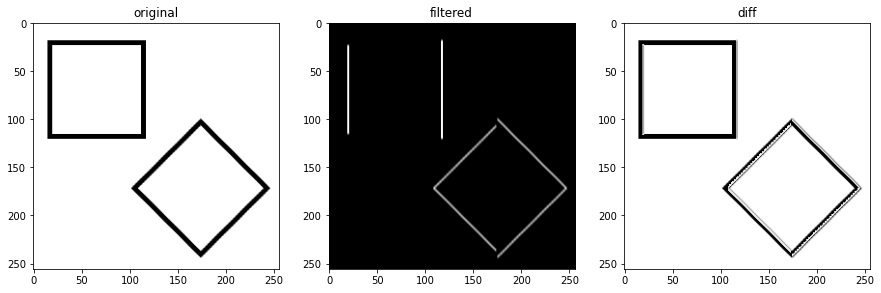

[[-1 -1  1]
 [ 0  0  0]
 [ 1  1  1]]
+128


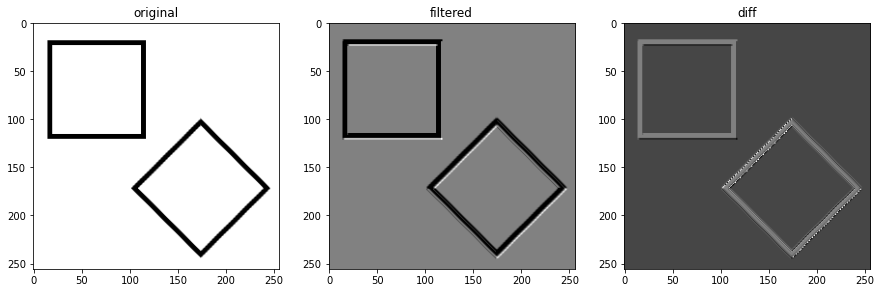

abs


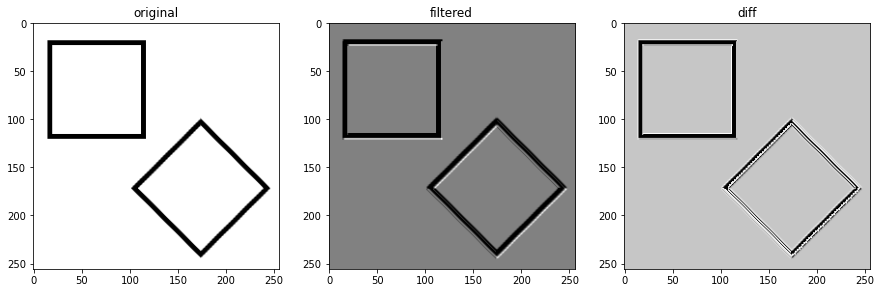

[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]
+128


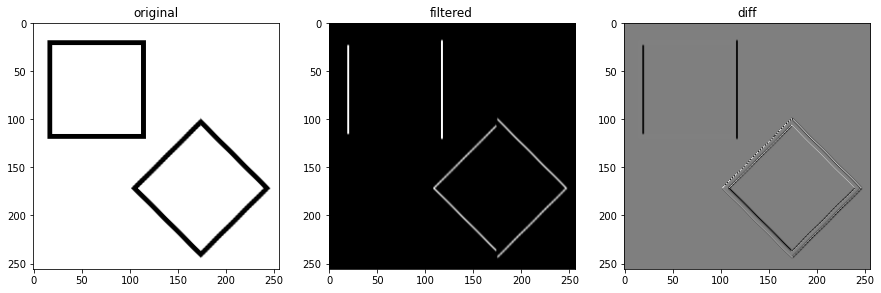

abs


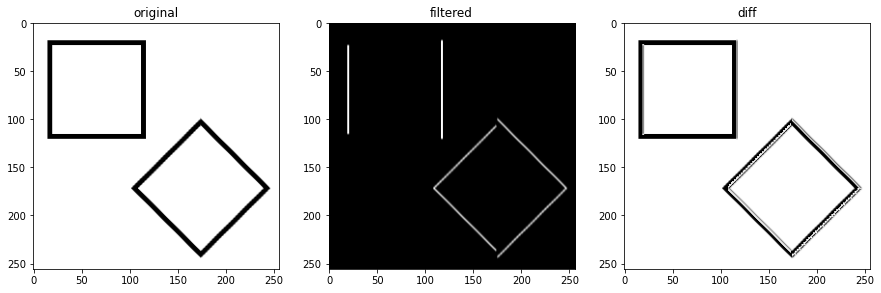

[[-1 -2  1]
 [ 0  0  0]
 [ 1  2  1]]
+128


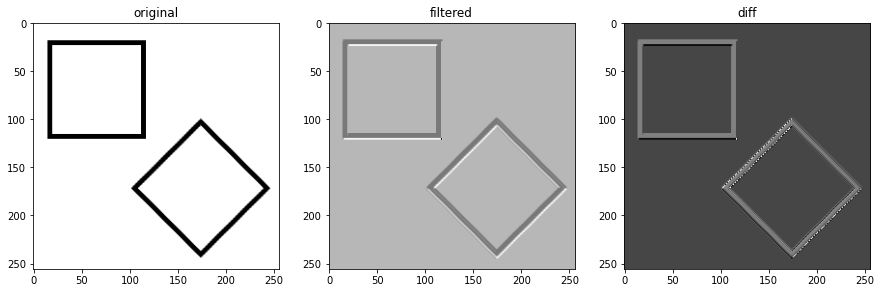

abs


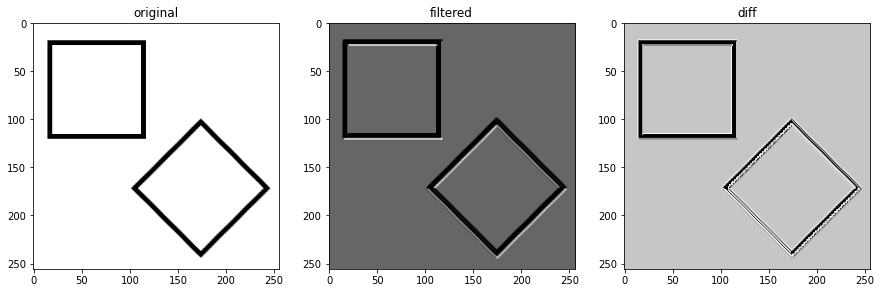

In [12]:
def gradient(img, mask):
    m = mask/mask.shape[0]**2

    res = filter(img, -1, m, plot=False, ret=True)

    plot_normalized(img, res)

masks = [
    (np.array([[0, 0, 0], [-1, 0, 0], [0, 1, 0]])),
    (np.array([[0, 0, 0], [0, 0, -1], [0, 1, 0]])),
    (np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])),
    (np.array([[-1, -1, 1], [0, 0, 0], [1, 1, 1]])),
    (np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])),
    (np.array([[-1, -2, 1], [0, 0, 0], [1, 2, 1]])),
]

for mask in masks:
    print(mask)
    gradient(kw, mask)


5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



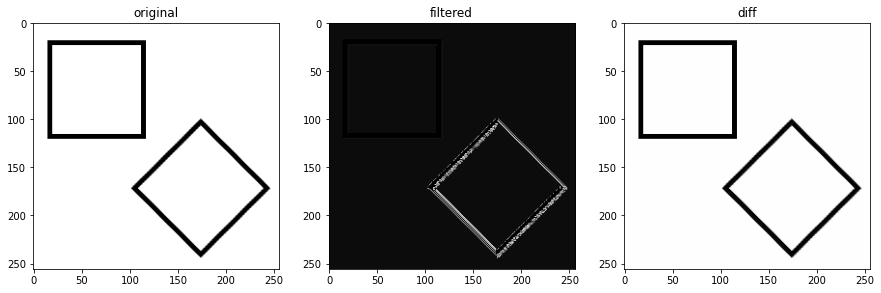

In [13]:
def filter_combined(img, masks):
    res = np.zeros(img.shape)

    for mask in masks:
        res += filter(img, -1, mask, ret=True, plot=False) ** 2

    res = np.sqrt(res)

    plot_filtration(img, res)

filter_combined(kw, [masks[0], masks[3]])

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

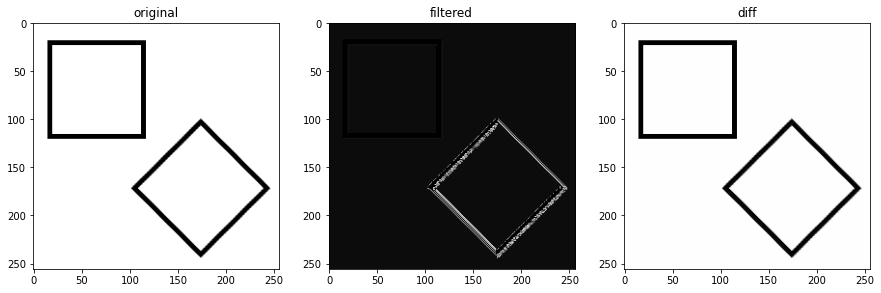

In [14]:
def filter_combined_simple(img, masks):
    res = np.zeros(img.shape)

    for mask in masks:
        res += np.abs(filter(img, -1, mask, ret=True, plot=False))

    plot_filtration(img, res)
filter_combined(kw, [masks[0], masks[3]])

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

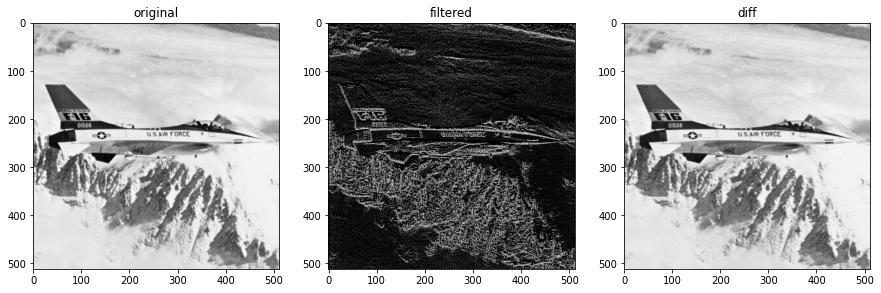

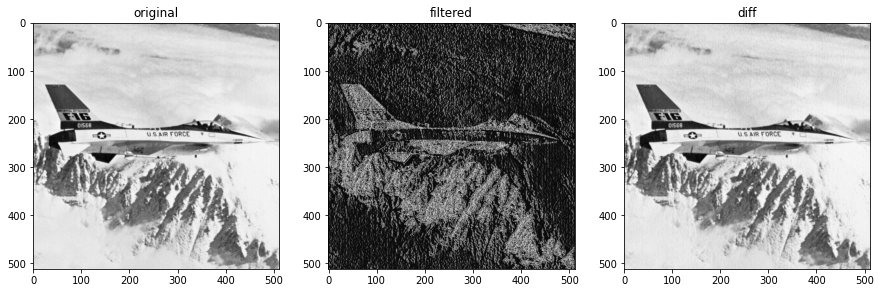

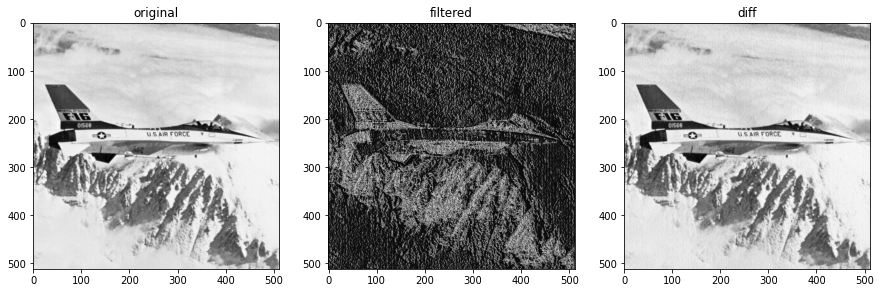

In [15]:
for i in range(0, 5, 2):
    filter_combined(jet, [masks[i], masks[i+1]])

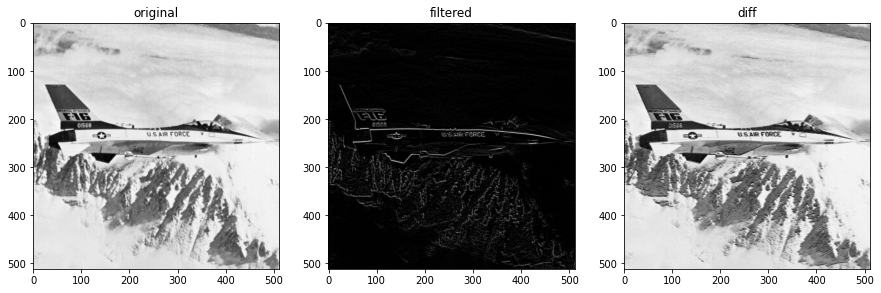

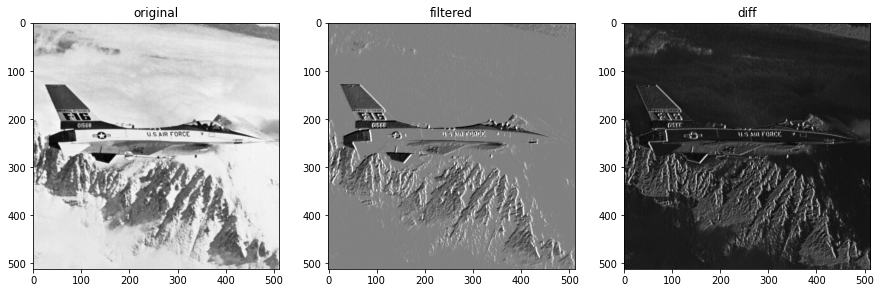

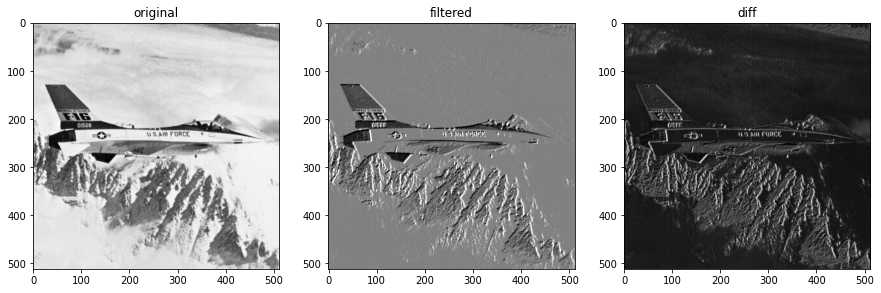

In [16]:
for i in range(0, 5,2):
    filter_combined_simple(jet, [masks[i], masks[i+1]])
